# <font color ='blue'> 1.Import Packages and data file

In [1]:
!pip install imblearn

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings

warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier
from sklearn.model_selection import StratifiedKFold,cross_val_score,GridSearchCV,train_test_split 
from sklearn.svm import SVC

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix

from imblearn.over_sampling import SMOTE

pd.options.display.float_format = '{:.2f}'.format

def line_func():
    print("="*100,'\n')

Using TensorFlow backend.


In [3]:
data = pd.read_csv('telecom_churn_data.csv',low_memory=False)

In [4]:
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.00,0.00,0.00,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.38,214.82,213.80,21.10,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,0.00,0.00,nan,nan,0.16,nan,nan,nan,4.13,nan,nan,nan,1.15,nan,nan,nan,5.44,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,nan,0.00,0.00,5.44,0.00,nan,nan,0.00,nan,nan,nan,0.00,nan,nan,nan,0.00,na

In [5]:
print('Data has {} rows and {} columns'.format(data.shape[0],data.shape[1]))

Data has 99999 rows and 226 columns


In [6]:
data2 = data.copy()

In [7]:
data.shape

(99999, 226)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [9]:
data.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,99999.00,99999.00,98981.00,98981.00,98981.00,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,99999.00,99999.00,99999.00,99999.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.00,94621.00,92254.00,96062.00,96140.

In [10]:
# There are no multiple entries of the same number
data.mobile_number.value_counts().head()

7002374769    1
7001115332    1
7000945323    1
7001852588    1
7000146605    1
Name: mobile_number, dtype: int64

# <font color ='blue'> 2. dentifying High Value Customer

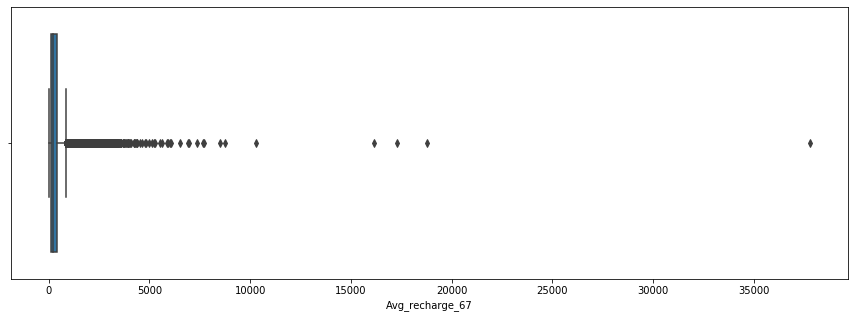

In [11]:
# Creating variable depicting average recharge in months 6 and 7
data['Avg_recharge_67'] = (data['total_rech_amt_6'] + data['total_rech_amt_7'])/2
plt.figure(figsize=(15,5))
sns.boxplot(data['Avg_recharge_67'])
plt.show()

In [12]:
# Finding 70th percentile value from Avg_Recharge to fi
data['Avg_recharge_67'].quantile(0.7)

368.5

In [13]:
#Filtering out the High Value Customer
data = data[data['Avg_recharge_67']>368.5]

In [14]:
data.shape

(29979, 227)

# <font color ='blue'> 3. Creating Labels , i.e Churn or Not 

***If there is no calls (either incoming or outgoing) AND no usage of mobile internet even once in the 9th month the mobile is considered to be churned***

In [15]:
data['Churn'] = np.where(data[['total_ic_mou_9','total_og_mou_9','vol_2g_mb_9','vol_3g_mb_9']].sum(axis=1)>0,0,1)

In [16]:
# Dropping the 9th month of data
data = data[data.columns[~data.columns.str.contains('_9')]]

# <font color ='blue'> 4.  Data Cleaning

In [17]:
# Dropping single value columns
for x in data.columns:
    if data[x].nunique()<2:
        data.drop(x,axis=1,inplace=True)

In [18]:
data.isnull().sum()[data.isnull().sum()>0]

onnet_mou_6                   316
onnet_mou_7                   303
onnet_mou_8                   938
offnet_mou_6                  316
offnet_mou_7                  303
offnet_mou_8                  938
roam_ic_mou_6                 316
roam_ic_mou_7                 303
roam_ic_mou_8                 938
roam_og_mou_6                 316
roam_og_mou_7                 303
roam_og_mou_8                 938
loc_og_t2t_mou_6              316
loc_og_t2t_mou_7              303
loc_og_t2t_mou_8              938
loc_og_t2m_mou_6              316
loc_og_t2m_mou_7              303
loc_og_t2m_mou_8              938
loc_og_t2f_mou_6              316
loc_og_t2f_mou_7              303
loc_og_t2f_mou_8              938
loc_og_t2c_mou_6              316
loc_og_t2c_mou_7              303
loc_og_t2c_mou_8              938
loc_og_mou_6                  316
loc_og_mou_7                  303
loc_og_mou_8                  938
std_og_t2t_mou_6              316
std_og_t2t_mou_7              303
std_og_t2t_mou

In [19]:
# Filling True and False value with modes since the reason this value is null because the service wasnt give to these customers
columns_tf = [x for x in data.columns if data[x].nunique()==2]
for x in columns_tf:
    data[x] = data[x].fillna(0)

In [20]:
# Similarly for data columns
columns_data = data.columns[data.columns.str.contains('3g')]
for x in columns_data:
    data[x] = data[x].fillna(0)
    
columns_data = data.columns[data.columns.str.contains('2g')]
for x in columns_data:
    data[x] = data[x].fillna(0)

In [21]:
data.isnull().sum()[data.isnull().sum()>0].head()

onnet_mou_6     316
onnet_mou_7     303
onnet_mou_8     938
offnet_mou_6    316
offnet_mou_7    303
dtype: int64

In [22]:
## For the rest of the columns , we will fill the null values by mean. Here we will take two means , 
##one of churners and the other of non churners and use them respectively.
for x in set(data.isnull().sum()[data.isnull().sum()>0].index).difference(set(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8','date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'])):
    data.loc[data['Churn'] == 0,x] = data.loc[data['Churn'] == 0,x].fillna(data[data.Churn==0][x].mean())
    data.loc[data['Churn'] == 1,x] = data.loc[data['Churn'] == 1,x].fillna(data[data.Churn==1][x].mean())

In [23]:
data.isnull().sum()[data.isnull().sum()>0]

date_of_last_rech_6            62
date_of_last_rech_7           114
date_of_last_rech_8           594
date_of_last_rech_data_6    18592
date_of_last_rech_data_7    18327
date_of_last_rech_data_8    18238
dtype: int64

# <font color ='blue'> 5.  Derived Columns
**Here we create a new feature which tells us when the last recharge happened and avg kpis for the past 3 months**

In [24]:
#Converting date columns into datetime objects
for x in data.columns[data.columns.str.contains('date')]:
    data[x] = pd.to_datetime(data[x])

In [25]:
data[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8']].max()

date_of_last_rech_6   2014-06-30
date_of_last_rech_7   2014-07-31
date_of_last_rech_8   2014-08-31
dtype: datetime64[ns]

In [26]:
data['last_recharge_date'] = data[['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8']].max(axis=1)
data['months_since_last_recharge'] = 9 - data['last_recharge_date'].dt.month 
data.drop(['date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8'],axis=1,inplace=True)

data['last_net_recharge_date'] = data[['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8']].max(axis=1)
data['months_since_last_net_recharge'] = 9 - data['last_net_recharge_date'].dt.month 
                                       
                                       
data.drop(['date_of_last_rech_data_6','date_of_last_rech_data_7','date_of_last_rech_data_8'],axis=1,inplace=True)
data.drop(['last_recharge_date','last_net_recharge_date'],axis=1,inplace=True)

In [27]:
data['avg_recharge'] = (data['total_rech_amt_6'] + data['total_rech_amt_7'] + data['total_rech_amt_8'])/3
data['total_number_of_recharge'] = (data['total_rech_num_6'] + data['total_rech_num_7'] + data['total_rech_num_8'])/3
data['total_roaming'] = data[['roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8']].sum(axis=1)/3
data['Avg_revenue'] = data[['arpu_6','arpu_7','arpu_8']].sum(axis=1)/3
data['months_since_last_net_recharge'] = data['months_since_last_net_recharge'].fillna(0)

In [28]:
data.describe()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,Avg_recharge_67,Churn,months_since_last_recharge,months_since_last_net_recharge,avg_recharge,total_number_of_recharge,total_roaming,Avg_revenue
count,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00,29979.00
mean,7001222959.77,587.59,589.42,535.07,299.76,307.84,273.86,422.90,428.47,382.97,17.65,13.77,14.31,29.74,22.44,23.21,95.66,96.54,88.40,183.10,182.77,170.01,7.04,7.15,6.59,1.58,1.88,1.76,285.82,286.4

In [29]:
#checking whether data is imbalanced or not
churn  = data["Churn"].value_counts()
churn_rate = churn[1]/(churn[1] + churn[0])

print("Total Churn Count     = {}".format(churn[1]))
print("Total Not-Churn Count = {}".format(churn[0]))
print("Churn Rate            = {:.2f}%".format(churn_rate*100))


Total Churn Count     = 2589
Total Not-Churn Count = 27390
Churn Rate            = 8.64%


#### Inference : Data is highly imbalanced

# <font color = 'blue'> 6. EDA

In [30]:
data.corr().style.background_gradient(cmap='coolwarm')

In [31]:
# Create correlation matrix
corr_matrix = data.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.80
high_corr_features = [column for column in upper.columns if any(upper[column] > 0.80)]

**We can see a lot of correlated variables (42), having correlation more than 0.8.
However , removing them manually is not optimal. Therefore we will use models which can handle it.**

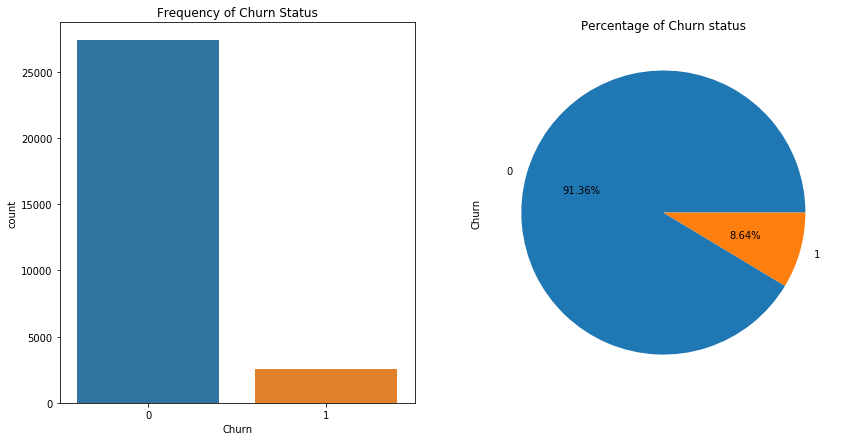

In [32]:
fig, axs = plt.subplots(1,2,figsize=(14,7))
sns.countplot(x='Churn',data=data,ax=axs[0])
axs[0].set_title("Frequency of Churn Status")


data.Churn.value_counts().plot(x=None,y=None, kind='pie', ax=axs[1],autopct='%1.2f%%')
axs[1].set_title("Percentage of Churn status")
plt.show()

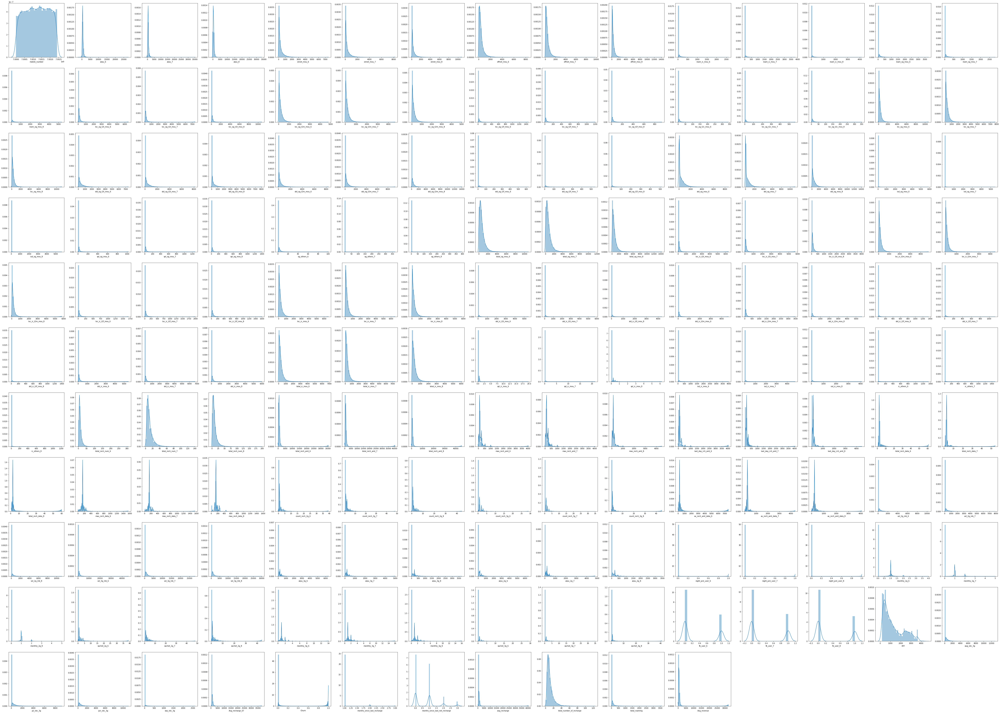

In [33]:
fig = plt.figure(figsize=(100,100))
num=1
for col in data.columns:
    try:    
        ax = fig.add_subplot(15,15,num)
        sns.distplot(data[col])
        num = num+1
    except:
        print(col,'not supported')
plt.show()

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

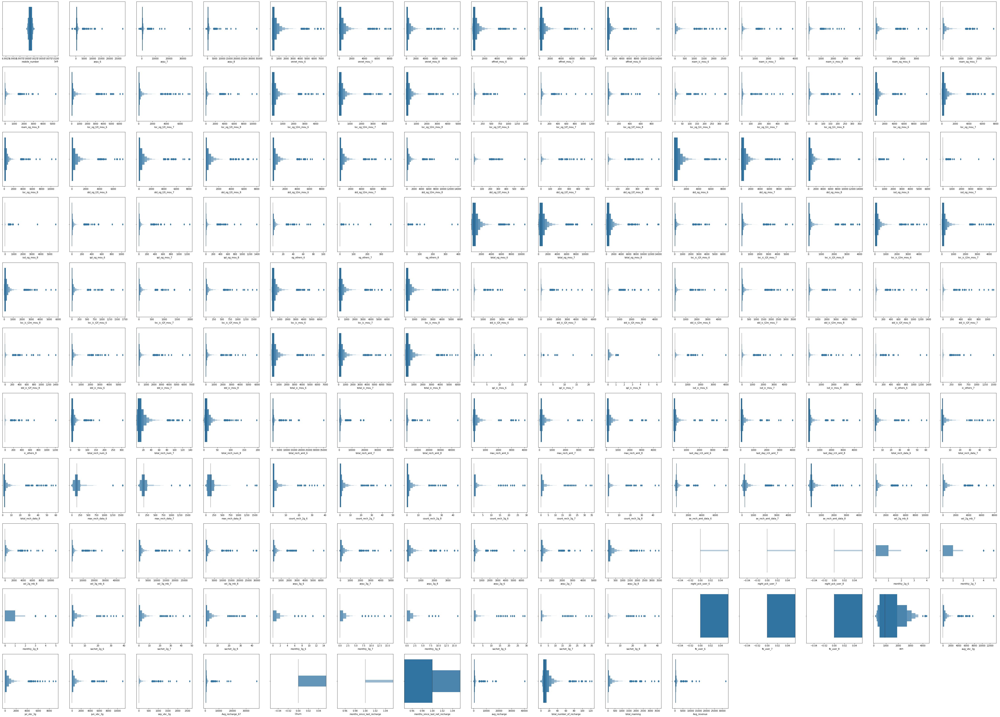

In [35]:
fig = plt.figure(figsize=(80,80))
num=1
for col in data.columns:
    try:    
        ax = fig.add_subplot(15,15,num)
        sns.boxenplot(data[col])
        num = num+1
    except:
        print(col,'not supported')
plt.show()

### <font color = 'blue'> 6.1 Univariate Analysis

In [36]:
def univariate_analysis(var):
    print(var.describe())
    line_func()
    sns.distplot(var)

count   29979.00
mean     1264.16
std       975.18
min       180.00
25%       480.00
50%       914.00
75%      1923.50
max      4321.00
Name: aon, dtype: float64



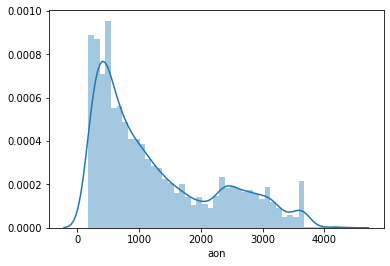

In [37]:
# Customers distribution of the age on network
univariate_analysis(data.aon)

<b> Minimun Age on network is 180 days.
    
 Average age on network for customers is 1264 days (3.5 years).


count   29979.00
mean      273.86
std       464.56
min         0.00
25%        34.06
50%       113.29
75%       298.22
max     10752.56
Name: onnet_mou_8, dtype: float64



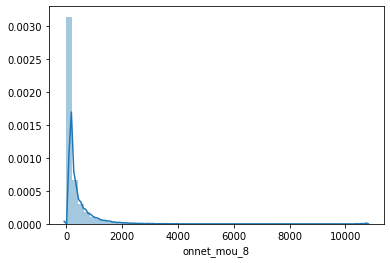

In [38]:
univariate_analysis(data.onnet_mou_8)

count   29979.00
mean        1.58
std         6.89
min         0.00
25%         0.00
50%         0.00
75%         0.03
max       342.86
Name: loc_og_t2c_mou_6, dtype: float64



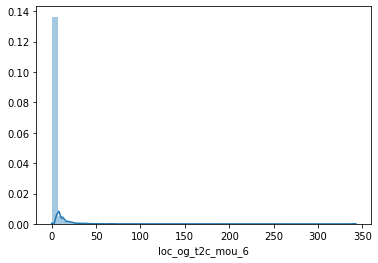

In [39]:
univariate_analysis(data.loc_og_t2c_mou_6)

### <font color = 'blue'> 6.2 Bivariate Analysis

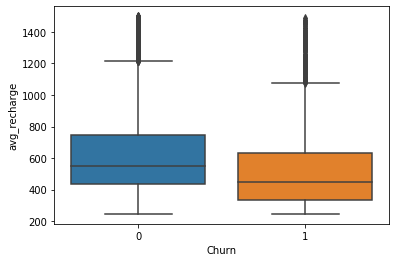

In [40]:
# We can see that the avg recharge is lower in the customer who have churned
sns.boxplot(y='avg_recharge',x='Churn',data= data[data.avg_recharge<1500])

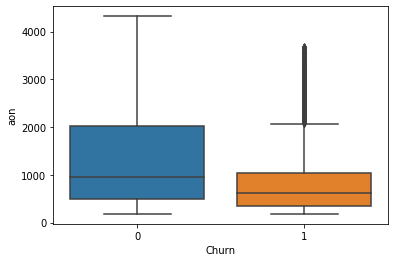

In [41]:
# New customers are more prone to churning
sns.boxplot(y='aon',x='Churn',data=data[data.loc_og_t2c_mou_6<50])

#### arpr (Average revenue per user)

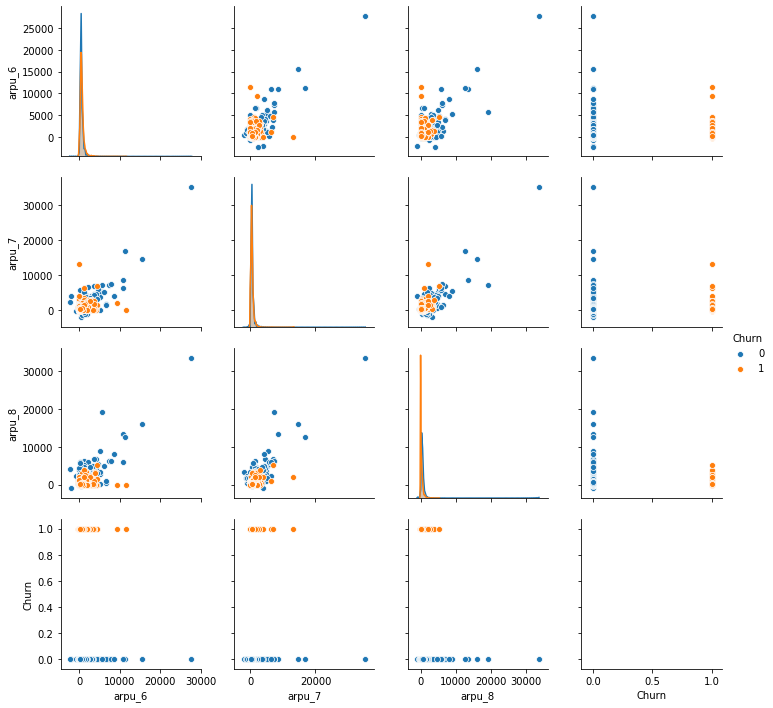

In [42]:
sns.pairplot(data=data[['arpu_6','arpu_7','arpu_8','Churn']],hue='Churn')
plt.show()

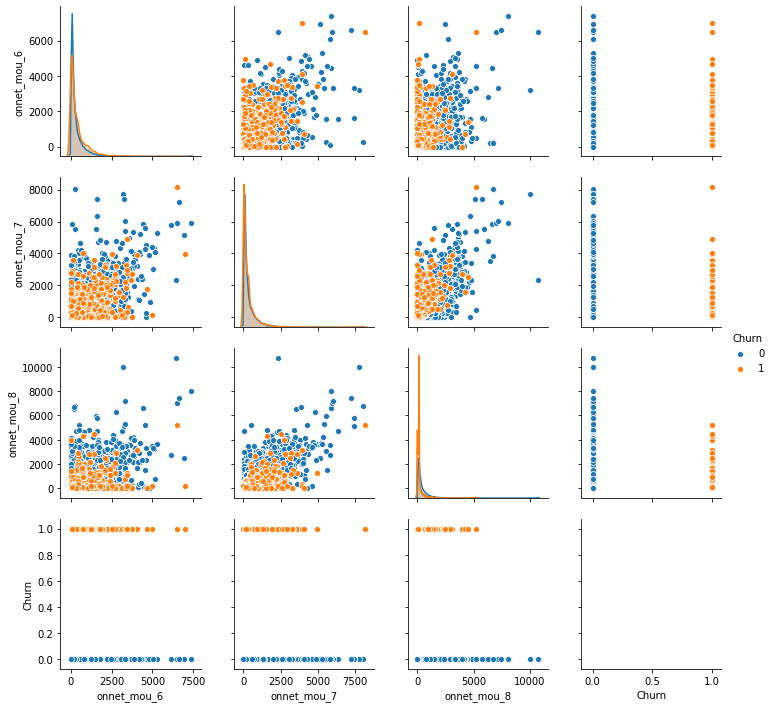

In [43]:
sns.pairplot(data=data[['onnet_mou_6','onnet_mou_7','onnet_mou_8','Churn']],hue='Churn')
plt.show()

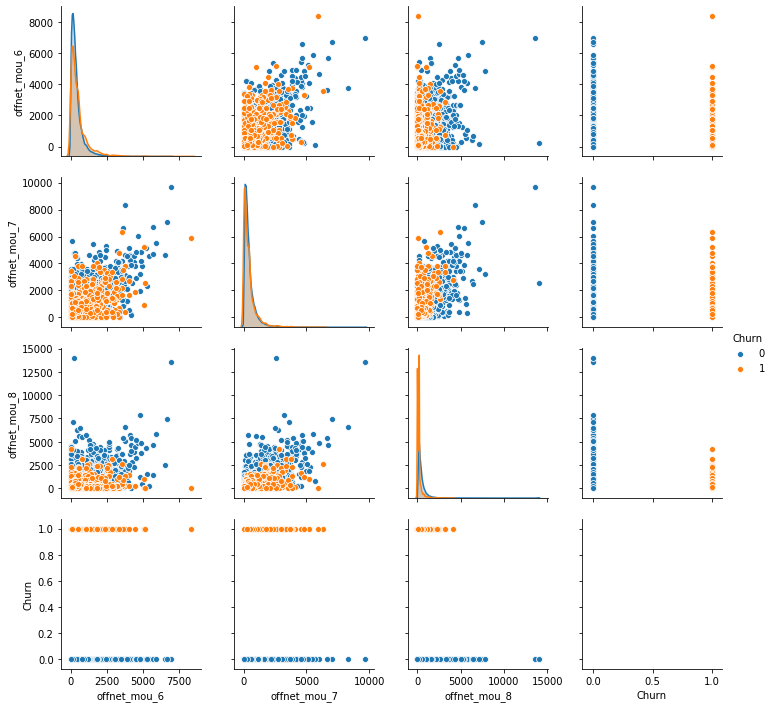

In [44]:
sns.pairplot(data=data[['offnet_mou_6','offnet_mou_7','offnet_mou_8','Churn']],hue='Churn')
plt.show()

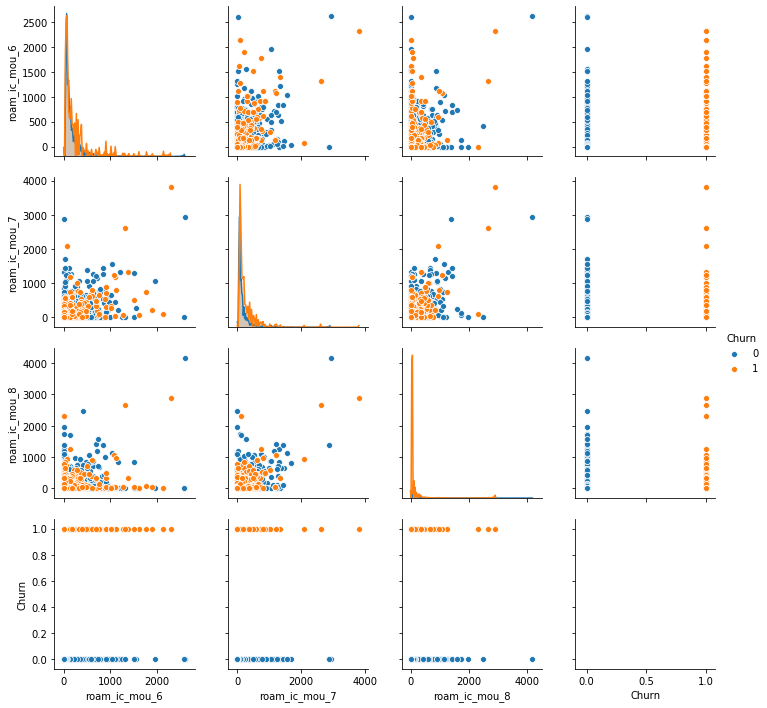

In [45]:
sns.pairplot(data=data[['roam_ic_mou_6','roam_ic_mou_7','roam_ic_mou_8','Churn']],hue='Churn')
plt.show()

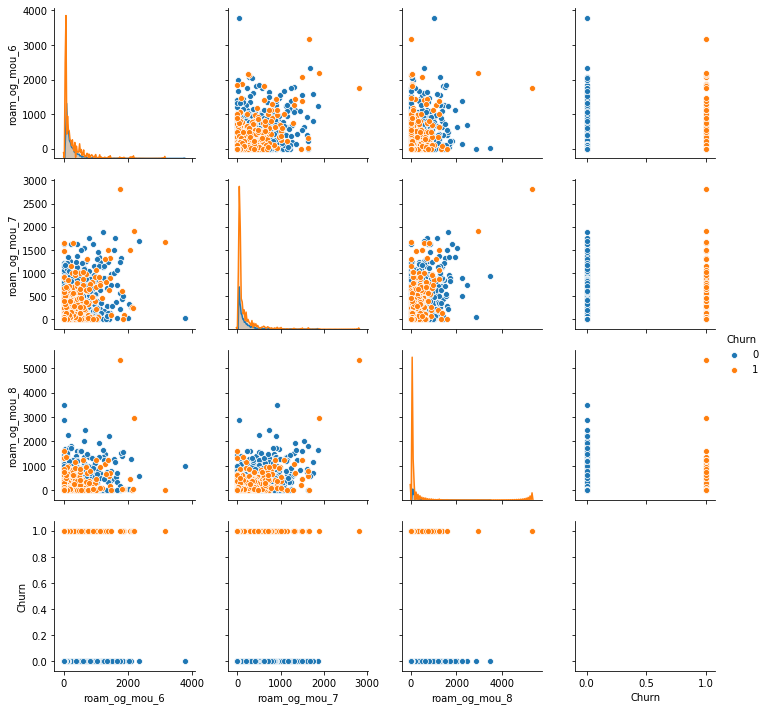

In [46]:
sns.pairplot(data=data[['roam_og_mou_6','roam_og_mou_7','roam_og_mou_8','Churn']],hue='Churn')
plt.show()

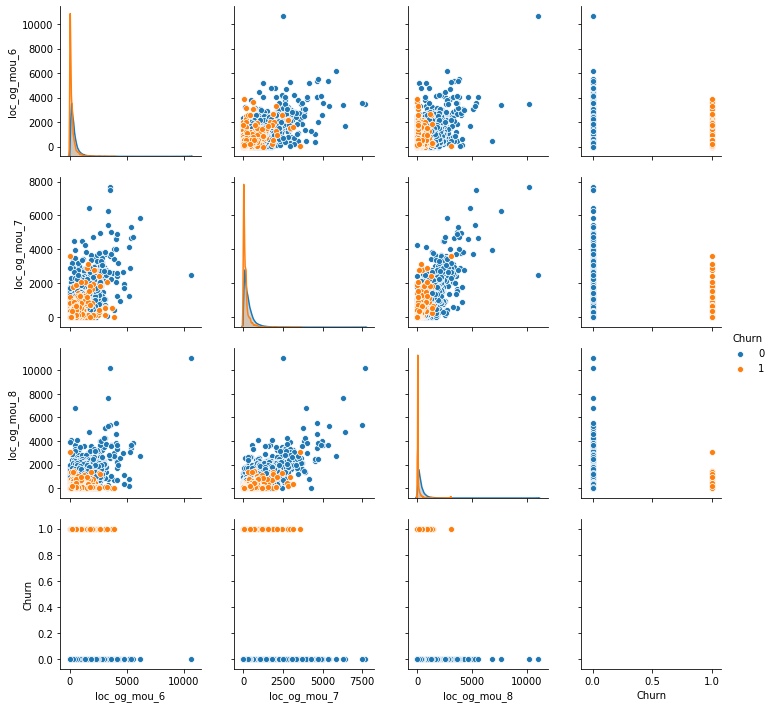

In [47]:
sns.pairplot(data=data[['loc_og_mou_6','loc_og_mou_7','loc_og_mou_8','Churn']],hue='Churn')
plt.show()

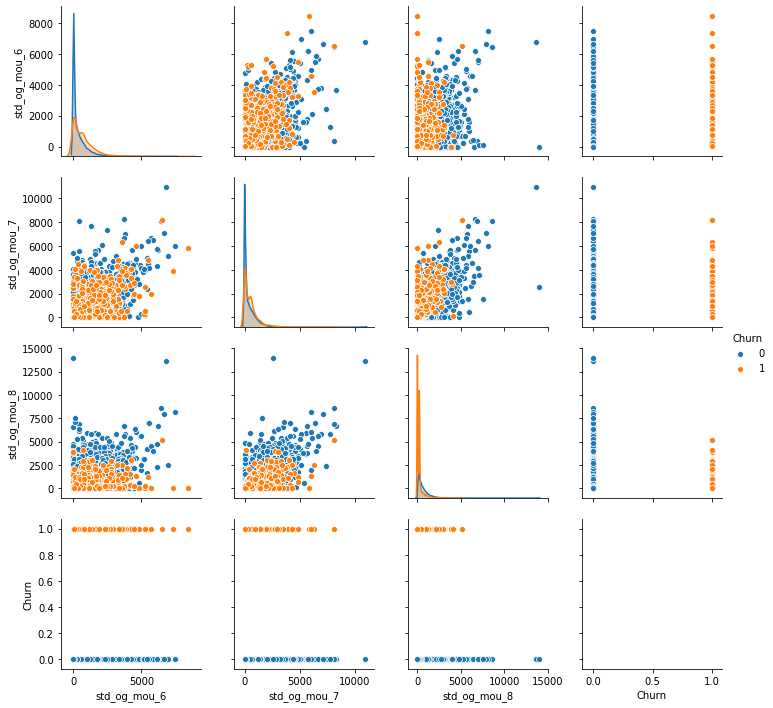

In [48]:
sns.pairplot(data=data[['std_og_mou_6','std_og_mou_7','std_og_mou_8','Churn']],hue='Churn')
plt.show()

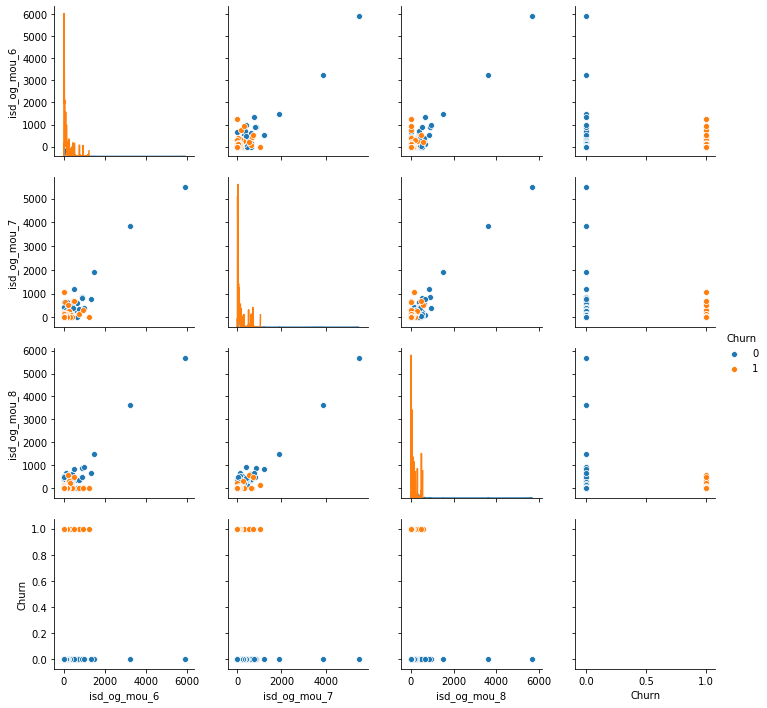

In [49]:
sns.pairplot(data=data[['isd_og_mou_6','isd_og_mou_7','isd_og_mou_8','Churn']],hue='Churn')
plt.show()

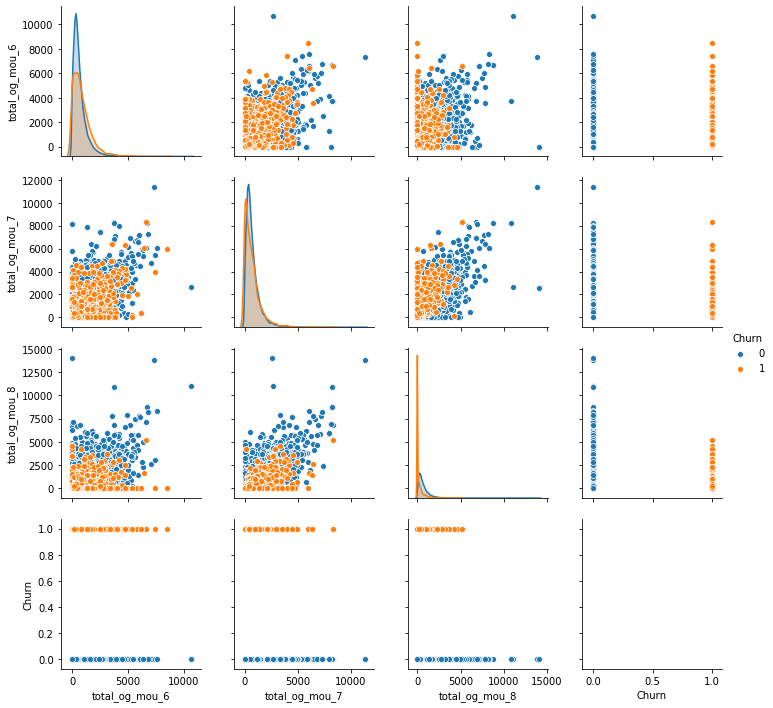

In [50]:
sns.pairplot(data=data[['total_og_mou_6','total_og_mou_7','total_og_mou_8','Churn']],hue='Churn')
plt.show()

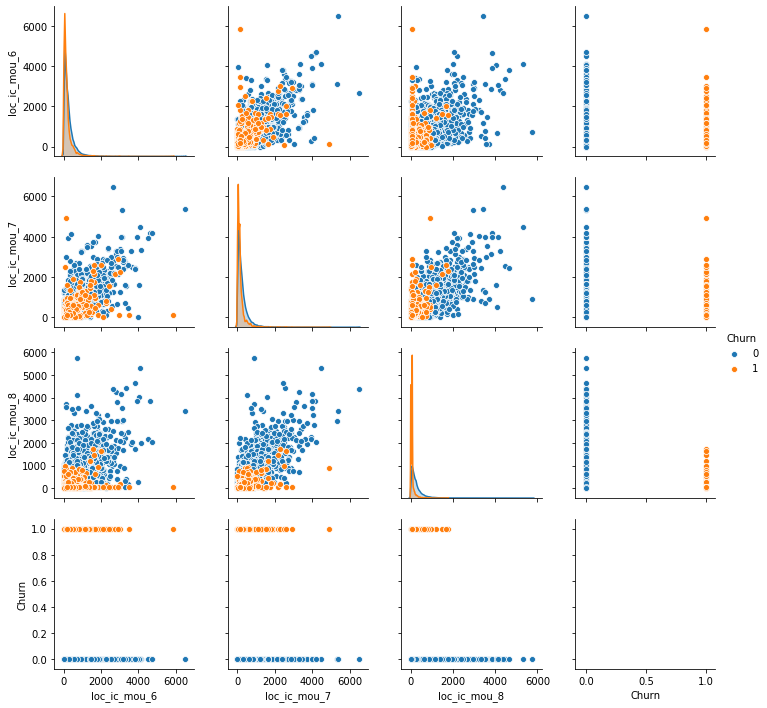

In [51]:
sns.pairplot(data=data[['loc_ic_mou_6','loc_ic_mou_7','loc_ic_mou_8','Churn']],hue='Churn')
plt.show()

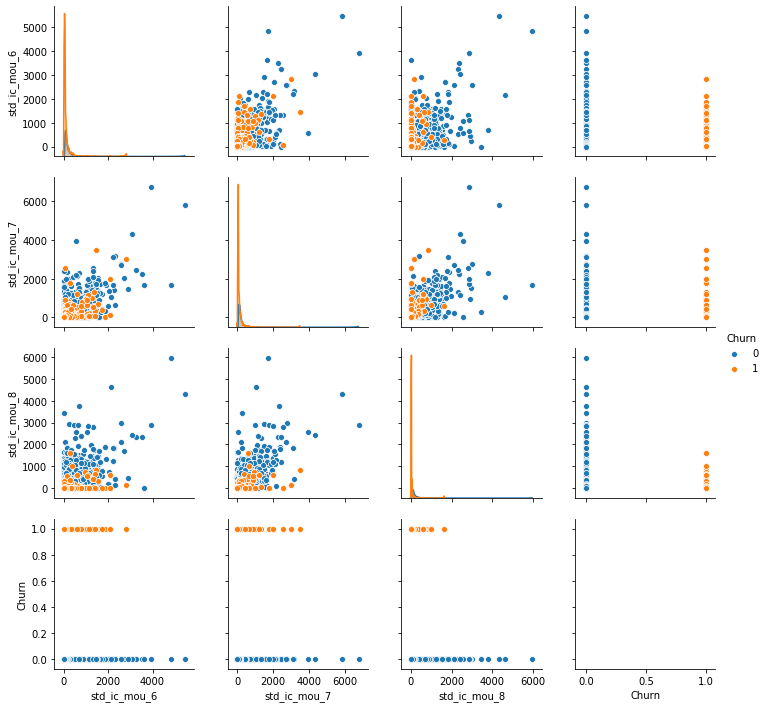

In [52]:
sns.pairplot(data=data[['std_ic_mou_6','std_ic_mou_7','std_ic_mou_8','Churn']],hue='Churn')
plt.show()

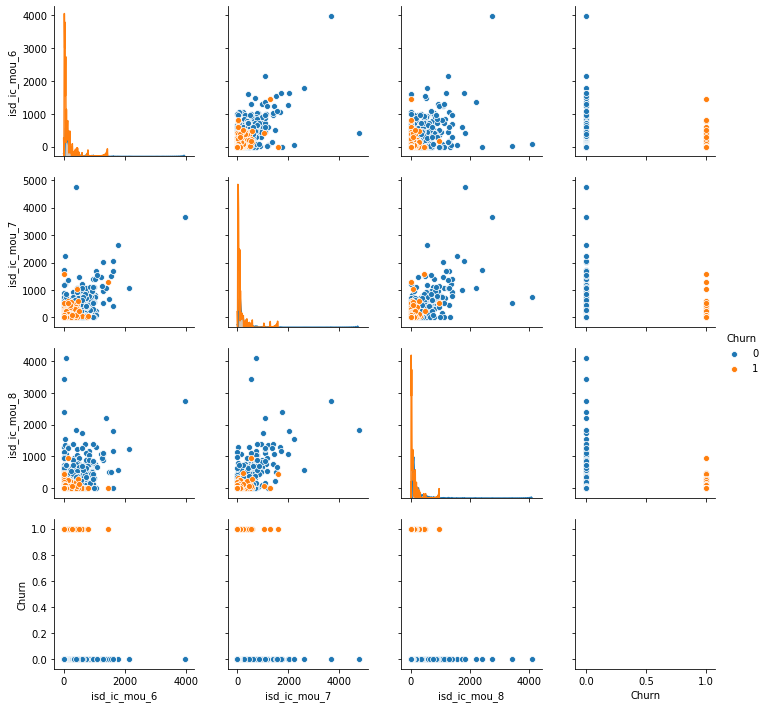

In [53]:
sns.pairplot(data=data[['isd_ic_mou_6','isd_ic_mou_7','isd_ic_mou_8','Churn']],hue='Churn')
plt.show()

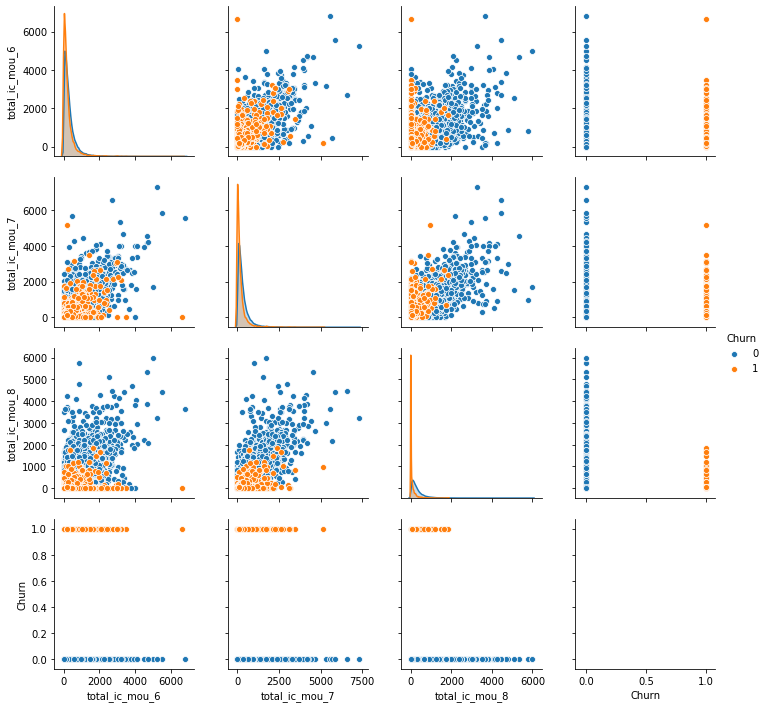

In [54]:
sns.pairplot(data=data[['total_ic_mou_6','total_ic_mou_7','total_ic_mou_8','Churn']],hue='Churn')
plt.show()

# <font color ='blue'> 7. Modelling with PCA

In [34]:
X = data.drop(['Churn','mobile_number'],axis=1)
y = data['Churn']

#Splitting Data for validation in Strartified manner
X_train, X_test, y_train, y_test = train_test_split(X,y,stratify = y,random_state=100)

In [35]:
X.columns

Index(['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6',
       ...
       'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g', 'Avg_recharge_67', 'months_since_last_recharge', 'months_since_last_net_recharge', 'avg_recharge', 'total_number_of_recharge', 'total_roaming', 'Avg_revenue'], dtype='object', length=159)

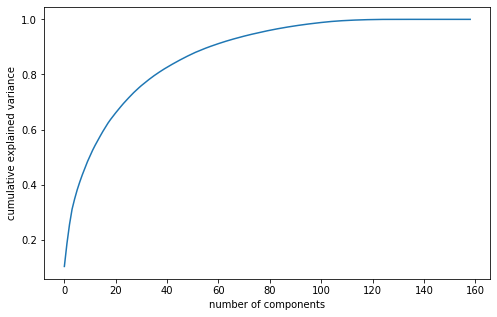

In [36]:
# Scaling data before PCA
sc = StandardScaler()
X_train_scaled = sc.fit_transform(X_train)
X_test_scaled = sc.transform(X_test)

pca = PCA(svd_solver='randomized', random_state=100)
pca.fit(X_train_scaled)

#Making the screeplot - plotting the cumulative variance against the number of components
fig = plt.figure(figsize = (8,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_),)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

***Selecting 90 component***

In [37]:
pca = PCA(svd_solver='randomized', random_state=100,n_components=90)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [38]:
corrmat = np.corrcoef(X_train_pca.transpose())
corrmat_nodiag = corrmat - np.diagflat(corrmat.diagonal())
print("max corr:",np.round(corrmat_nodiag.max(),4), ", min corr: ", np.round(corrmat_nodiag.min(),2))

max corr: 0.0 , min corr:  -0.0


***Using Cost Senstivized Logistic Regression over PCA components***

In [39]:
model = LogisticRegression(class_weight='balanced')
model.fit(X_train_pca,y_train)
pred = model.predict(X_test_pca)

In [40]:
dd=metrics.accuracy_score(y_test,pred),metrics.roc_auc_score(y_test,model.predict_proba(X_test_pca)[:,1])
print('Accuracy : ',dd[0])
print('ROC : ',dd[1])

Accuracy :  0.85657104736491
ROC :  0.9082388702711294


In [41]:
print(classification_report(y_test,pred))
print(confusion_matrix(y_test,pred))

              precision    recall  f1-score   support

           0       0.98      0.86      0.92      6848
           1       0.36      0.85      0.50       647

    accuracy                           0.86      7495
   macro avg       0.67      0.85      0.71      7495
weighted avg       0.93      0.86      0.88      7495

[[5873  975]
 [ 100  547]]


### Tuning the model's probability

In [42]:
pred_df = pd.DataFrame(y_test)
pred_df['Prob_1'] = model.predict_proba(X_test_pca)[:,1]

In [43]:
pred_df[pred_df.Churn==1].head()

,Churn,Prob_1
30303,1,0.91
87252,1,0.49
72986,1,0.71
99431,1,0.91
41414,1,0.82


In [44]:
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    pred_df[i]= pred_df.Prob_1.map( lambda x: 1 if x > i else 0)
pred_df[pred_df.Churn==1].head()

,Churn,Prob_1,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
30303,1,0.91,1,1,1,1,1,1,1,1,1,1
87252,1,0.49,1,1,1,1,1,0,0,0,0,0
72986,1,0.71,1,1,1,1,1,1,1,1,0,0
99431,1,0.91,1,1,1,1,1,1,1,1,1,1
41414,1,0.82,1,1,1,1,1,1,1,1,1,0


In [45]:
# Calculate accuracy sensitivity and specificity for various probabilities.

cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix
num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix( pred_df.Churn, pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

      prob  accuracy  sensi  speci
0.00  0.00      0.09   0.00   1.00
0.10  0.10      0.49   0.44   0.96
0.20  0.20      0.63   0.60   0.94
0.30  0.30      0.73   0.72   0.91
0.40  0.40      0.81   0.80   0.89
0.50  0.50      0.86   0.86   0.85
0.60  0.60      0.89   0.90   0.81
0.70  0.70      0.92   0.93   0.75
0.80  0.80      0.93   0.96   0.60
0.90  0.90      0.93   0.98   0.32


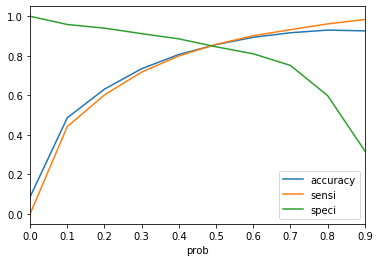

In [46]:
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])

**We can see the range is between 0.4 and 0.5, lets tune it further**

In [47]:
pred_df_4 = pred_df[['Churn','Prob_1']]

numbers = [np.round(x,2) for x in np.arange(0.4,0.5,0.01)]
for i in numbers:
    pred_df_4[i]= pred_df_4.Prob_1.map( lambda x: 1 if x > i else 0)

cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix
num = [0.4,0.41,0.42,0.43,0.44,0.45,0.46,0.47,0.48,0.49]
for i in num:
    cm1 = metrics.confusion_matrix( pred_df_4.Churn, pred_df_4[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    sensi = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    speci = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

      prob  accuracy  sensi  speci
0.40  0.40      0.81   0.80   0.89
0.41  0.41      0.81   0.81   0.88
0.42  0.42      0.82   0.81   0.88
0.43  0.43      0.82   0.82   0.87
0.44  0.44      0.83   0.83   0.87
0.45  0.45      0.83   0.83   0.86
0.46  0.46      0.84   0.84   0.86
0.47  0.47      0.84   0.84   0.85
0.48  0.48      0.85   0.85   0.85
0.49  0.49      0.85   0.85   0.85


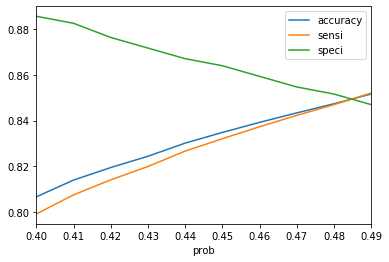

In [48]:
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])

In [49]:
pred_df['Predicted'] = pred_df.Prob_1.map( lambda x: 1 if x > 0.48 else 0)

In [50]:
print('Accuracy is ',metrics.accuracy_score(pred_df['Predicted'],pred_df['Churn']))
pd.crosstab(pred_df['Predicted'],pred_df['Churn'])

Accuracy is  0.8473649099399599


Churn,0,1
Predicted,,
0,5800,96
1,1048,551


***we are able to identify 85% of the customers who have churned.***

## Evalutaing different Models

In [51]:
model1 = SVC()
model2 = RandomForestClassifier()
model3 = LogisticRegression()
model4 = AdaBoostClassifier()

In [52]:
model1.fit(X_train_scaled,y_train)
model2.fit(X_train_scaled,y_train)
model3.fit(X_train_scaled,y_train)
model4.fit(X_train_scaled,y_train)

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=None)

In [53]:
pred1 = model1.predict(X_test_scaled)
pred2 = model2.predict(X_test_scaled)
pred3 = model3.predict(X_test_scaled)
pred4 = model4.predict(X_test_scaled)


print('SVC : ',metrics.accuracy_score(pred1,y_test))
print('RandomForestClassifier : ',metrics.accuracy_score(pred2,y_test))
print('LogisticRegression : ',metrics.accuracy_score(pred3,y_test))
print('AdaboostClassifier : ',metrics.accuracy_score(pred4,y_test))

SVC :  0.9662441627751834
RandomForestClassifier :  0.989993328885924
LogisticRegression :  0.9729152768512341
AdaboostClassifier :  0.989993328885924


# <font color ='blue'> 8. RandomForest
    We can see RandomForest is performing the best here therefore we will go ahead with RandomForest as it will make a more generalized model as well compared to others.
    Lets train a model on original and derived features to observe the relationship

In [54]:
print("X_train Dataframe Shape {}".format(X_train_scaled.shape))
print("X_test Dataframe Shape {}".format(X_test.shape))

y_train_imbalance= (y_train != 0).sum()/(y_train == 0).sum()
y_test_imbalance = (y_test != 0).sum()/(y_test == 0).sum()
print("Imbalance in Train Data: {}".format(y_train_imbalance))
print("Imbalance in Test Data: {}".format(y_test_imbalance))

X_train Dataframe Shape (22484, 159)
X_test Dataframe Shape (7495, 159)
Imbalance in Train Data: 0.09453801966702366
Imbalance in Test Data: 0.09448014018691589


### SMOTE for handling Imbalance

In [56]:
#balancing Data Set USING SMOTE

sm = SMOTE(kind = "regular")
X_tr,y_tr = sm.fit_sample(X_train_scaled,y_train)

print("X_tr Dataframe Shape {}".format(X_tr.shape))
print("y_tr Dataframe Shape {}".format(y_tr.shape))

data_imbalance = (y_tr != 0).sum()/(y_tr == 0).sum()
print("Imbalance in Train Data: {}".format(data_imbalance))

model_rf = RandomForestClassifier()
model_rf.fit(X_tr,y_tr)

X_tr Dataframe Shape (41084, 159)
y_tr Dataframe Shape (41084,)
Imbalance in Train Data: 1.0


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [57]:
y_pred_prob = model_rf.predict_proba(X_test_scaled)
y_pred = model_rf.predict(X_test_scaled)

In [58]:
metrics.accuracy_score(y_pred,y_test)

0.9897264843228819

In [59]:
pd.crosstab(y_pred,y_test)

Churn,0,1
row_0,,
0,6837,66
1,11,581


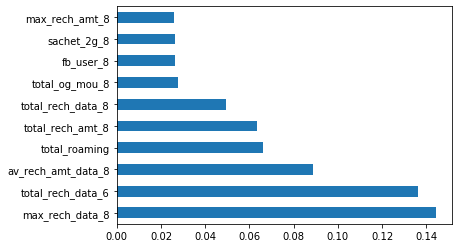

In [60]:
feat_importances = pd.Series(model_rf.feature_importances_, index=X_train.columns)
feat_importances.nlargest(10).plot(kind='barh')

**Since we are not getting much significant difference, lets proceed without using SMOTE as we have the option to go with cost senstivized Random Forest**

# Hyper paramter tuning

### Grid Search CV to Find Optimal Hyperparameters and do cross validation with 3 folds

In [108]:
# Create the parameter grid

param_grid = {
     'max_depth': [4,8,10],
     'min_samples_leaf': range(100, 400, 200),
     'min_samples_split': range(200, 500, 200),
     'n_estimators': [100,200, 300], 
     'max_features': [5, 10,20,30,40,50]
 }
# Create a based model
rf = RandomForestClassifier(class_weight='balanced')
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                           cv = 3, n_jobs = -1,verbose = 1) 

In [109]:
# Fit the grid search to the data
#grid_search.fit(X_train, y_train)
grid_search.fit(X_train_scaled,y_train)

Fitting 3 folds for each of 216 candidates, totalling 648 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed: 54.7min
[Parallel(n_jobs=-1)]: Done 648 out of 648 | elapsed: 84.0min finished


GridSearchCV(cv=3, error_score='raise-deprecating',
             estimator=RandomForestClassifier(bootstrap=True, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators='warn', n_jobs=None,
                                              oob_score=False,
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid

In [111]:
# optimal accuracy score and hyperparameters
print('We can get accuracy of',grid_search.best_score_,'using',grid_search.best_params_)

We can get accuracy of 0.9914161181284469 using {'max_depth': 10, 'max_features': 50, 'min_samples_leaf': 100, 'min_samples_split': 200, 'n_estimators': 200}


In [63]:
# model with the best hyperparameters
rfc = RandomForestClassifier(class_weight='balanced',
                             bootstrap=True,
                              max_depth=10,
                              min_samples_leaf=100, 
                              min_samples_split=200,
                              max_features=50,
                              n_estimators=200,n_jobs=-1)

rfc.fit(X_train_scaled,y_train)
predictions = rfc.predict(X_test_scaled)

In [64]:
# # evaluation metrics
print(classification_report(y_test,predictions))
print(confusion_matrix(y_test,predictions))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      6848
           1       0.92      0.92      0.92       647

    accuracy                           0.99      7495
   macro avg       0.96      0.96      0.96      7495
weighted avg       0.99      0.99      0.99      7495

[[6797   51]
 [  52  595]]


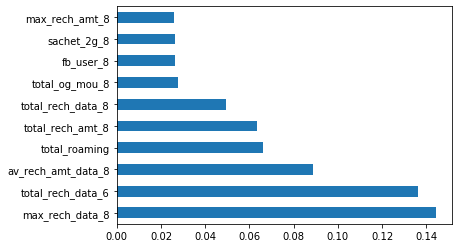

In [65]:
feat_importances = pd.Series(model_rf.feature_importances_, index=X_train.columns)
feat_importances.nlargest(10).plot(kind='barh');

***Business Recommendations*** 

From the above we can clearly infer that calls related incoming & outgoing within a circle is key for identifying churn customers

The other key factor is if the recharge amount decreases in the action phase is sign of churn
Age on network is also a key indicator for identifying the churn 
If aon is less than 500 days and their usage is reduce then the customer is going to be churned
data usage & amount can also be the other features for understanding the churn behavior